In [1]:
%pylab inline
import os
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    raise ImportError('install ipyvolume for display') 

import haloSim
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTask

#important constant
C_LIGHT=2.99792458e8        # m/s
GNEWTON=6.67428e-11         # m^3/kg/s^2
KG_PER_SUN=1.98892e30       # kg/M_solar
M_PER_PARSEC=3.08568025e16  # m/pc

Populating the interactive namespace from numpy and matplotlib


In [7]:
for iz in range(15):
    rsmth=int(3**(1.-iz/10.)+0.5)
    print(rsmth)

3
3
2
2
2
2
2
1
1
1
1
1
1
1
1


In [2]:
cd wrkDir/sim/HSC-like-sim-pre/

/work/xiangchong.li/work/massMapSparse/sim/HSC-like-sim-pre


In [7]:
# Simulation
iz  =   0
im  =   0

log_m_array=np.linspace(13.5,15.5,9)
z_array=np.linspace(0.01,1.01,9)
names=('iz','im','zh','log10_M200','conc','rs_arcmin')
data=[]
z_h=z_array[iz]
log_m=log_m_array[im]
M_200=   10.**(log_m)
conc =   6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
halo =   haloSim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
print('redshift is %.2f' %z_h)
print('logM is %.2f' %log_m)

ig=0
# load simualtion
if False:
    datU=Table.read('sims/stampSim_HSClike_mask_shapenoise_photoz-202003282257.fits')
    ng=int(len(datU)//100)
    datU=datU[ig*ng:(ig+1)*ng]
    lensKer= halo.lensKernel(datU['ztrue'])
    shearR=  halo.DeltaSigmaComplex(datU['raR']*3600.,datU['decR']*3600.)*lensKer
    shearH=  halo.DeltaSigmaComplex(datU['raH']*3600.,datU['decH']*3600.)*lensKer
    Sigma=halo.Sigma(datU['raR']*3600.,datU['decR']*3600.)
    datU['g1R']=shearR.real
    datU['g2R']=shearR.imag
    datU['g1H']=shearH.real
    datU['g2H']=shearH.imag
    datU['Sigma']=Sigma
else:
    ngroup  =   100
    infname =   'sims/TJ03-202004021856/stampSim-HSC_like-TJ03-%d,%d-202004021856.fits' %(iz,im)
    datTab  =   pyfits.getdata(infname)
    ng=len(datTab)//ngroup
    datU=datTab[ig*ng:(ig+1)*ng]

redshift is 0.01
logM is 13.50


In [8]:
# Pixelation
ver='pix10-nl20'
zer='pz'
hdir='./pixelize-equalNum-%s/' %ver
odir='./reconstruct-%s' %ver

outfname0   =  os.path.join(hdir,'pixSigma-%d-%d-%s.fits' %(iz,im,zer))
outfname1   =  os.path.join(hdir,'pixShearR-g1-%d-%d-%s-wn.fits' %(iz,im,zer))
outfname2   =  os.path.join(hdir,'pixShearR-g2-%d-%d-%s-wn.fits' %(iz,im,zer))
outfname3   =  os.path.join(hdir,'pixStd.fits')
outfname4   =  os.path.join(hdir,'lensing_kernel-%s.fits' %zer)

# configuration
configName  =   'config-%s.ini' %ver
parser      =   ConfigParser()
parser.read(configName)
parser.set('prepare','g1fname',outfname1)
parser.set('prepare','g2fname',outfname2)
parser.set('prepare','sigmafname',outfname3)
parser.set('prepare','lkfname',outfname4)
parser.set('file','outDir',odir)
parser.set('lensZ','zmin','0.05')
parser.set('lensZ','zscale','0.05')
parser.set('lensZ','nlp','15')

print(parser.get('transPlane','smooth_scale'))
print(parser.get('prepare','g2fname'))

gridInfo    =   cartesianGrid3D(parser)

if False:
    print('preparing the pixelation file for Sigma')
    raname  =   'raR'
    decname =   'decR'
    zname   =   'zbest'
    pixSigma=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],Sigma)

if not os.path.isfile(outfname1):
    print('preparing the pixelation file')
    g1name  =   'g1R'
    g2name  =   'g2R'
    raname  =   'raR'
    decname =   'decR'
    if '-zt' in outfname1:
        zname   =   'ztrue'
    elif '-pz' in outfname1:
        zname   =   'zbest'
    if '-nn' in outfname1:
        val=(datU[g1name])+(datU[g2name])*1j
    elif '-wn' in outfname1:
        val=(datU[g1name]+datU['g1n'])+(datU[g2name]+datU['g2n'])*1j
    outcome=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val)
    pyfits.writeto(outfname1,outcome.real,overwrite=True)
    pyfits.writeto(outfname2,outcome.imag,overwrite=True)
    
dtheta=parser.getfloat('transPlane','scale')*60. #arcsec
print('rs of the input halo is %.3f pixels.' %(halo.rs_arcsec/dtheta))
print('r truncate of the input halo is %.3f pixels.' %(halo.rs_arcsec/dtheta*halo.c))
print('the average density contrast should be %.3f.' %(halo.M/(halo.rs/halo.c)**2./np.pi/halo.Sigma_M_bin(0.51,0.56)))
# lensing kernel
if not os.path.isfile(outfname4):
    print('preparing the lens kernel file')
    datDir='/work/xiangchong.li/work/S16ACatalogs/'
    tn='9347.fits'
    cfn='%s/S16AStandardCalibrated/tract/%s' %(datDir,tn)
    cdata=pyfits.getdata(cfn)
    poz_best=cdata['mlz_photoz_best']
    pfn='%s/S16AStandardCalibrated/tract/%s_pofz.fits' %(datDir,tn.split('.')[0])
    poz_data=pyfits.getdata(pfn)['PDF']
    bfn='%s/S16AStandardV2/field/pz_pdf_bins_mlz.fits' %datDir
    poz_bins=pyfits.getdata(bfn)['BINS']
    if zer=='pz':
        lensKernel= gridInfo.lensing_kernel(poz_grids=poz_bins,poz_data=poz_data,poz_best=poz_best)
    elif zer=='zt':
        lensKernel= gridInfo.lensing_kernel()
    pyfits.writeto(outfname4,lensKernel,overwrite=True)
    
## Noise variance
if not os.path.isfile(outfname3):
    print('preparing the noise std file')
    ngroup=100
    pixDatAll=np.zeros((ngroup,)+gridInfo.shape,dtype=np.complex128)
    for ig in range(ngroup):
        datU=datTab[ig*ng:(ig+1)*ng]
        g1name  =   'g1R'
        g2name  =   'g2R'
        raname  =   'raR'
        decname =   'decR'
        zname   =   'zbest'
        val=(datU[g1name]+datU['g1n'])+(datU[g2name]+datU['g2n'])*1j
        outcome=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val)
        pixDatAll[ig]=outcome
    pixSigmaErr=np.std(pixDatAll,axis=0)
    outfname3   =  os.path.join(hdir,'pixStd.fits')
    pyfits.writeto(outfname3,pixSigmaErr,overwrite=True)

if False:
    noiName='../HSC-like-sim/sims/stampSim_HSClike_mask_shapenoise_photoz-202003282257.fits'
    noise=  pyfits.getdata(noiName)
    ngroup=100
    ng=int(len(noise)//ngroup)
    for ig in range(ngroup):
        datU=noise[ig*ng:(ig+1)*ng]
        fname='../HSC-like-sim/sims/shapenoise_photoz-202003282257/sim%d.fits' %ig
        pyfits.writeto(fname,datU,overwrite=True)
        
# Reconstruction Init
tau=0.
parser.set('sparse','lbd','5.' )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','nframe','1' )
parser.set('sparse','minframe','0' )
parser.set('sparse','tau','%s' %tau)
parser.set('sparse','debugList','[]')
sparse3D    =   massmapSparsityTask(parser)

1.5
./pixelize-equalNum-pix10-nl20/pixShearR-g2-0-0-pz-wn.fits
rs of the input halo is 10.714 pixels.
r truncate of the input halo is 59.653 pixels.
the average density contrast should be 9.917.


6
[[ 4.32534268  5.98287928  7.29545686  7.98057243  7.92788956  7.15483399
   5.81948214  4.01700347]
 [ 6.18370067  8.90048035 11.64488556 13.34763594 13.37046815 11.86749756
   9.40784185  6.39307183]
 [ 7.54450336 11.61717796 17.18698667 21.55632047 21.79708652 18.32227351
  13.28951783  8.43349912]
 [ 8.2646506  13.4308961  21.79168683 29.50752125 30.11202108 23.86459151
  15.67031353  9.23478586]
 [ 8.13744791 13.24085834 21.43308452 29.62811927 31.09320829 24.67539443
  15.71742917  8.99908551]
 [ 7.17432509 11.21287    16.77524635 22.30519768 24.04752813 20.15162066
  13.38025819  7.79254482]
 [ 5.77413227  8.6529962  11.75022522 14.46685946 15.40396137 13.45078121
   9.45573748  5.73641576]
 [ 4.24544594  6.2307095   7.90234094  9.05794408  9.25273322  8.01303674
   5.73113593  3.6106664 ]]
31.093208288624773
817.7422145864377


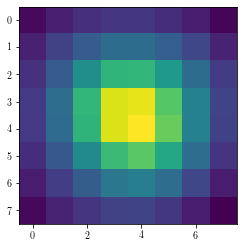

In [32]:
for i,zl in enumerate(gridInfo.zlcgrid):
    if z_h>gridInfo.zlbound[i] and z_h<gridInfo.zlbound[i+1]:
        print(i)
        rhoM_ave=gridInfo.cosmo.rho_m(zl)
        DaBin=gridInfo.cosmo.Da(gridInfo.zlbound[i],gridInfo.zlbound[i+1])
        pixSigma0=pixSigma[0]/(rhoM_ave*DaBin)
rshow=4
toshow=pixSigma0[48-rshow:48+rshow,48-rshow:48+rshow]
plt.imshow(toshow)
print(toshow)
print(toshow.max())
print(np.sum(toshow))

0.003540055029994781
0.009476476586735193


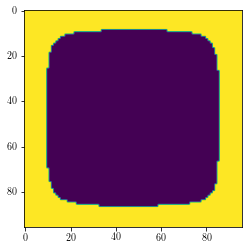

In [50]:
imshow(sparse3D.sigmaA[0,0])
print(np.average(sparse3D.diagonal[0,0]))
print(np.max(sparse3D.diagonal[0,0]))

0.003540055029994781
0.009476476586735193


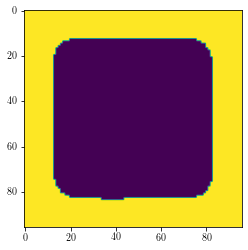

In [5]:
imshow(sparse3D.sigmaA[0,0])
print(np.average(sparse3D.diagonal[0,0]))
print(np.max(sparse3D.diagonal[0,0]))

In [8]:
# Tests
## Hist Tests
if False:
    toPlot=sparse3D.diagonal[0,0]
    normL=np.sum(sparse3D.lensKernel**2.,axis=0)[0]
    print(normL)
    #Spectrum
    hist=plt.hist(toPlot.flatten(),bins=40)
    print(np.median(toPlot.flatten()))
    print(np.average(toPlot.flatten()))

if False:
    sparse3D.sigmaSInv=  np.zeros(sparse3D.shapeS)
    sparse3D.sigmaSInv[sparse3D.mask]=  1.

    sparse3D.lensKernel=np.ones((sparse3D.nz,sparse3D.nlp))
    sparse3D.fast_chi2diagonal_est()
    toPlot=sparse3D.diagonal[0,1]
    normL=np.sum(sparse3D.lensKernel**2.,axis=0)[0]
    print(normL)
    #Spectrum
    hist=plt.hist(toPlot.flatten()/normL,bins=40)
    print(np.median(toPlot.flatten()/normL))
    print(np.average(toPlot.flatten()/normL))
    print(toPlot[int(sparse3D.ny/2),int(sparse3D.nx/2)]) 

if False:
    hist=plt.hist(sparse3D.sigmaA.flatten(),bins=40)
    print(np.median(sparse3D.sigmaA.flatten()))
    print(np.average(sparse3D.sigmaA.flatten()))

if False:
    hist=plt.hist(sparse3D.sigmaS.flatten(),bins=40,range=(0.,1e-1))
    print(np.median(sparse3D.sigmaS.flatten()))
    print(np.average(sparse3D.sigmaS.flatten()))
    
## Image Test

if False:
    # Ensure the noise on model space is normalized for each zlens bin
    ishow=1
    toshow=sparse3D.sigmaA[ishow,0,20:76,20:76]
    plt.imshow(toshow)
    print(np.average(toshow))

if False:
    # Ensure the projectors are normalized
    ishow=1
    a=np.zeros(sparse3D.shapeA)
    a[ishow,0,48,48]=1
    a2=sparse3D.main_forward(a)
    alphaRSim=  np.abs(a2)
    toshow=alphaRSim[ishow,40:56,40:56]
    plt.imshow(toshow)
    print(np.sum(alphaRSim**2.))

if False:
    #Correlations of the projectors
    ishow=0
    b=sparse3D.chi2_transpose(a2)
    toshow=b[ishow,0,24:72,24:72]
    plt.imshow(toshow)
    print(toshow.max())

if False:
    ishow=1
    toshow=sparse3D.diagonal[ishow,0,20:76,20:76]
    plt.imshow(toshow)
    print(toshow.min())
    
if False:
    ishow=14
    toshow=sparse3D._w[ishow,0,10:86,10:86]
    plt.imshow(toshow)
    print(toshow.max())
    print(np.average(sparse3D._w[:,0,20:76,20:76]))
    print(np.average(sparse3D._w[sparse3D.sigmaA<1e8])/2.)

shape of lensing kernel:  (10, 15) = (10, 15)
0.004584748891245386 0.00458360424650228 1.0002497259103422
0.006970427739914738 0.006968925512790236 1.0002155607950962
0.00887971026319581 0.008864788010180728 1.0016833175252409
0.010398349073952024 0.01031819297998722 1.0077684236106335
0.011523679370005247 0.011374910324982017 1.013078700470851
0.012281156978974077 0.012083200617536191 1.0163827753675292
0.012730103261728349 0.012504355496509785 1.0180535306503062
0.012945814983619254 0.012683855281431154 1.0206530030795606
0.012959049003204834 0.012654377124994379 1.0240764025918494
0.012813080182107675 0.012447981037615474 1.0293299888061318


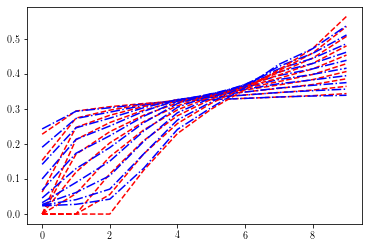

In [66]:
lk1=gridInfo.lensing_kernel()
lk2=sparse3D.lensKernel
print('shape of lensing kernel: ',lk1.shape,'=',lk2.shape)
for izl in range(0,10):
    norm1=np.sqrt(np.sum(lk1[:,izl]**2.))
    norm2=np.sqrt(np.sum(lk2[:,izl]**2.))
    print(norm1,norm2,norm1/norm2)
    plt.plot(lk1[:,izl]/norm1,'--',c='red')
    plt.plot(lk2[:,izl]/norm2,'-.',c='blue')

0.225 0.135


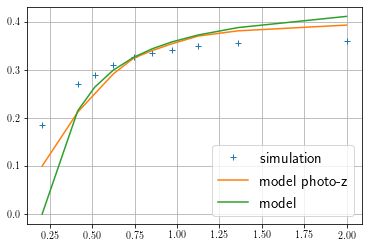

In [67]:
izl=3
halo=haloSim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
#SigmaArray=halo.Sigma(datU['raR']*3600.,datU['decR']*3600.)
lensKer= halo.lensKernel(datU['ztrue'])
kerzshow=np.zeros(gridInfo.nz)
for i in range(gridInfo.nz):
    mask=(datU['zbest']>gridInfo.zbound[i])&(datU['zbest']<=gridInfo.zbound[i+1])
    kerzshow[i]=np.average(halo.M*lensKer[mask])
norm1=np.sqrt(np.sum(kerzshow**2.))
norm2=np.sqrt(np.sum(lk1[:,izl]**2.))
norm3=np.sqrt(np.sum(lk2[:,izl]**2.))
plt.plot(gridInfo.zcgrid,kerzshow/norm1,'+',label='simulation')
plt.plot(gridInfo.zcgrid,lk2[:,izl]/norm2,label='model photo-z')
plt.plot(gridInfo.zcgrid,lk1[:,izl]/norm3,label='model')
plt.grid()
plt.legend(fontsize=15,loc='lower right')
print(sparse3D.zlBin[izl],z_h)

# sparse analysis

In [5]:
sparse3D.process(1500)

In [12]:
if True:
    p=np.zeros(sparse3D.shapeA)
    ss=sparse3D.alphaR*sparse3D._w

    for iz in range(sparse3D.nlp):
        for ifr in range(sparse3D.nframe):
            if ifr==0:
                rsmth=int(3**(1.-iz/10.)+0.5)
            else:
                rsmth=1
            for jsh in range(-rsmth,rsmth+1):
                dif    =   np.roll(ss[iz,ifr],jsh,axis=-2)
                for ish in range(-rsmth,rsmth+1):
                    dif2=   np.roll(dif,ish,axis=-1)
                    p[iz,ifr] += dif2/(2.*rsmth+1.)**2.
    p=np.abs(p)
    if True:
        # weight with normalized results?
        ratio=np.average(sparse3D._w[sparse3D.sigmaA<1e8])/2.
        p=p/sparse3D._w*ratio

    thres_adp=1./1e10
    mask=(p>thres_adp)

    w=np.zeros(sparse3D.shapeA)
    w[mask]=1./(p[mask])**(1.)
    w[~mask]=1./thres_adp
    sparse3D.fista_gradient_descent(800,w=w)
else:
    p=np.zeros(sparse3D.shapeA)
    ss=sparse3D.alphaR*sparse3D._w

    rsmth=1
    num=0.
    for jsh in range(-rsmth,rsmth+1):
        dif    =   np.roll(ss,jsh,axis=-2)
        for ish in range(-rsmth,rsmth+1):
            dif2=   np.roll(dif,ish,axis=-1)
            p +=dif2
            num+=1
    p=np.abs(p/num)
    ratio=np.average(sparse3D._w[sparse3D.sigmaA<1e8])/2.
    p=p/sparse3D._w*ratio

    thres_adp=1./1e10
    mask=(p>thres_adp)

    w=np.zeros(sparse3D.shapeA)
    w[mask]=1./(p[mask])**(1.)
    w[~mask]=1./thres_adp
    sparse3D.fista_gradient_descent(800,w=w)

In [6]:
sparse3D.reconstruct()
ipv.figure()
vol1=ipv.volshow(sparse3D.deltaR,level=[0.95,0.70,0.01],opacity=[1.,0.3,0.005],extent=[[-sparse3D.ny//2,sparse3D.nx//2],[-sparse3D.ny//2,sparse3D.nx//2],[0.01,1.01]])
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()
#ipv.pylab.savefig('./after_adaptive_frame1_smooth.png')

/work/xiangchong.li/lsstsw/miniconda/envs/lsst-scipipe/lib/python3.7/site-packages/ipyvolume/serialize.py:92: RuntimeWarning: invalid value encountered in true_divide
  gradient = gradient / np.sqrt(gradient[0] ** 2 + gradient[1] ** 2 + gradient[2] ** 2)


In [41]:
ratio

8.33366181074271

In [44]:
print(np.max(p[sparse3D.sigmaA<1e8]))

27.21565909430101


30.48567817519366
1.020799683019361
30.48567817519366
0.4 0.45000000000000007
12.429357913073881
795.4789064367284
[[ 1.10389883  2.5812429   4.56718749  6.03451282  5.96448549  4.45162142
   2.49569994  1.02079968]
 [ 3.01801891  6.46192124 10.80194475 14.06529504 14.26873198 11.24279973
   6.70422601  2.88948468]
 [ 5.96991941 11.71389713 18.34960128 23.36407871 24.18361377 19.92819427
  12.45363759  5.56540199]
 [ 8.59588689 15.82705624 23.52640276 29.26935698 30.47037481 25.61411831
  16.32968226  7.40333267]
 [ 8.97460066 16.23107931 23.87471697 29.54438096 30.48567818 25.24480154
  15.83272023  7.08287561]
 [ 6.78138114 12.78461146 19.74735376 25.14178021 25.71541662 20.49931419
  12.27104156  5.27440546]
 [ 3.75497231  7.8300189  13.29518887 17.85591541 18.35559257 14.19272119
   8.11298416  3.33402841]
 [ 1.56583587  3.74469843  7.04457401  9.98198526 10.42390015  7.99308408
   4.47508917  1.79573382]]


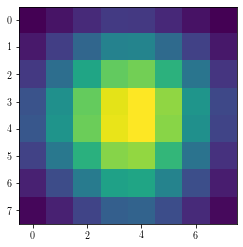

In [43]:
ishow=7
rshow=4
toshow=sparse3D.deltaR[ishow,48-rshow:48+rshow,48-rshow:48+rshow]
plt.imshow(toshow)
print(np.abs(toshow).max())
print(toshow.min())
print(toshow.max())
zav=sparse3D.zlBin[ishow]
zmin=zav-sparse3D.zlscale/2.
zmax=zav+sparse3D.zlscale/2.
print(zmin,zmax)
pix_mpc=halo.cosmo.Da(0.,0.51)*1./60./180.*np.pi
print(np.average(toshow))
print(np.sum(toshow))
print(toshow)

In [195]:
import detect3D
data=sparse3D.deltaR
detect3D.local_maxima_3D(data)

(array([[ 7, 48, 47],
        [ 8, 42, 47],
        [14, 79, 67]]),
 array([32.08775535, 12.51445833,  3.85184425]))

Text(0, 0.5, 'prob')

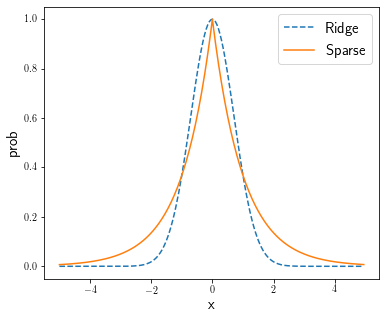

In [53]:
plt.figure(figsize=(6,5))
a=np.arange(-5,5,0.05)
plt.plot(a,np.exp(-a**2.),'--',label='Ridge')
plt.plot(a,np.exp(-np.abs(a)),label='Sparse')
plt.legend(fontsize=15)
plt.xlabel('x',fontsize=15)
plt.ylabel('prob',fontsize=15)

Text(0, 0.5, '$x_2$')

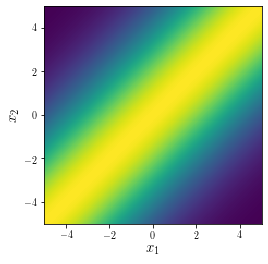

In [69]:
A,B=np.meshgrid(a,a)
C=np.exp(-(A-B)**2./20)
plt.imshow(C,origin='lower',extent=[-5,5,-5,5],interpolation='None')
plt.xlabel(r'$x_1$',fontsize=15)
plt.ylabel(r'$x_2$',fontsize=15)

In [ ]:
# For coordinate descent based
# Three ways to get the correaltion of basis vector
ii1=7
ii2=3
ind1=sparse3D.ind1list[ii1]
ind2=sparse3D.ind1list[ii2]
print(sparse3D.get_basis_cov(ind1,ind2))
print(sparse3D.projCor[ii1,ii2])
print(sparse3D.projCor[ii2,ii1])
ind1=(13,1,71,22)
ind2=(14,2,71,21)
# 1
print(np.sum(np.conjugate(sparse3D.get_basis_vector(ind1))*sparse3D.get_basis_vector(ind2)).real)

# 2
a0=sparse3D.get_basis_vector(ind1)
print(sparse3D.chi2_transpose(a0)[ind2])

# 3
print(sparse3D.get_basis_cov(ind1,ind2))

# spectrum
print(sparse3D.get_basis_cov(ind1,ind1))
print(1./sparse3D.mu0[ind1])